In [23]:
import torch, random
import torch.nn as nn
import torch.nn.functional as F
from torchvision import transforms
import cv2
import math
import pandas as pd
import numpy as np
import os, random, torch
from PIL import Image
from boxsdk import OAuth2, Client
import subprocess
from sklearn.cluster import DBSCAN
from IPython.display import clear_output

transform3 = transforms.Compose([
    transforms.Resize((100, 100)),
    transforms.RandomHorizontalFlip(),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.5, 0.5, 0.5], std=[0.5, 0.5, 0.5])
])

class BirdNet(nn.Module):
    def __init__(self):
        super(BirdNet, self).__init__()
        # Convolutional layers with larger kernel sizes
        self.conv1 = nn.Conv2d(3, 16, kernel_size=7, padding=3)
        self.conv2 = nn.Conv2d(16, 32, kernel_size=7, padding=3)
        self.conv3 = nn.Conv2d(32, 64, kernel_size=5, padding=2)
        self.pool = nn.MaxPool2d(kernel_size=2, stride=2)
        self.fc1 = nn.Linear(64 * 12 * 12, 1024)
        self.fc2 = nn.Linear(1024, 128)
        self.fc3 = nn.Linear(128, 3)

    def forward(self, x):
        x = self.pool(F.relu(self.conv1(x)))
        x = self.pool(F.relu(self.conv2(x)))
        x = self.pool(F.relu(self.conv3(x)))
        x = x.view(x.size(0), -1)  # Flatten the tensor
        x = F.relu(self.fc1(x))
        x = F.relu(self.fc2(x))
        return self.fc3(x)
    
def make_spreadsheet():
    spreadsheet_folder_path = os.path.join(PROJECT_FOLDER, 'oldspreadsheets')
    sheets = []
    for i in os.listdir(spreadsheet_folder_path):
        if '.xlsx' in i:
            sheet = pd.read_excel(os.path.join(spreadsheet_folder_path, i))
            if 'Lek' in i:
                sheet.columns = sheet.iloc[0]
                sheet.drop(0, axis=0, inplace=True)
            sheets.append(sheet)
    spreadsheet = pd.concat(sheets)
    spreadsheet = spreadsheet[['Folder', 'Lek', 'Pista', 'DateRange', 'FileName', 'Male', 'PresentYN', 'DisplayYN', 'Snaps', 'quietSnaps', 'Grunts', 'Rolls', 'Calls', 'FemVisitation', 'Copulation', 'JuvPresent', 'Gardening', 'Notes', 'Observer']]
    spreadsheet = spreadsheet.replace({'Y': 1, 'y': 1, 'N': 0, 2: 1})
    spreadsheet = spreadsheet[(spreadsheet['PresentYN'] != 'PresentYN') & (spreadsheet['FemVisitation'] != 'FemVisitation') & (spreadsheet['FemVisitation'] != 'Maybe')].reset_index(drop=True)
    return spreadsheet

def index_to_path(sheet, indx):
    choice = sheet.iloc[indx]
    cols = sheet.columns[:5]
    base_folder = '/Volumes/Extreme SSD/PROJECT MANACUS'

    for next_col in cols:
        base_folder = os.path.join(str(base_folder), str(choice[next_col]))

    if os.path.exists(base_folder):
        return base_folder
    else:
        return False

def sample_files(spreadsheet, n):
    temp = spreadsheet
    temp['combination'] = temp['Lek'] + ' ' + temp['Pista']
    sample_df = pd.DataFrame()
    for combo in temp['combination'].unique():
        subset = temp[temp['combination'] == combo]
        if len(subset) >= n:
            subset = subset.sample(n=n)
        sample_df = pd.concat([sample_df, subset])
    return sample_df.drop(columns='combination').reset_index(drop=True)

def euclidean_distance(center1, center2):
    x1, y1 = center1
    x2, y2 = center2
    distance = math.sqrt((x2 - x1)**2 + (y2 - y1)**2)
    return distance

def apply_dbscan(data, epsilon, min_samples):
    data_array = np.array(data)
    dbscan = DBSCAN(eps=epsilon, min_samples=min_samples)
    cluster_labels = dbscan.fit_predict(data_array)
    unique_labels = np.unique(cluster_labels[cluster_labels != -1])
    cluster_centers = []
    for label in unique_labels:
        cluster_points = data_array[cluster_labels == label]
        center = np.mean(cluster_points, axis=0)
        cluster_centers.append(tuple(center))  # Convert center to tuple
    return cluster_centers

def cluster_again(cluster_centers):
    # check if cluster_centers is not empty 
    if len(cluster_centers) > 0:
        cluster_centroids = apply_dbscan(cluster_centers, 100, 1)
        final_clusters = []
        for c in cluster_centroids:
            final_cluster_point = (int(c[0]), int(c[1]))
            final_clusters.append(final_cluster_point)
        return final_clusters
    else:
        return []

def try5(ssdfilepath):
    if os.path.exists(ssdfilepath):
        half_roi_size = 100
        arena_name = os.path.splitext(os.path.basename(ssdfilepath))[0]
        arena = os.path.join(PROJECT_FOLDER, 'try3', 'images', arena_name)  # Update this line
        if not os.path.exists(arena):
            os.makedirs(arena)
            print(arena, 'made')
        femalecount = 0
        malecount = 0
        all_centers = []
        #open_folder(arena)
        cap = cv2.VideoCapture(ssdfilepath)
        ret, prev_frame_color = cap.read()  # Initialize prev_frame with the first frame
        if not ret:
            print("Could not read the first frame.")
        frame_count = 0
    
        blank_frame = np.zeros_like(prev_frame_color)
        while cap.isOpened():
            frame_count += 1
            ret, frame_color = cap.read()
            
            if not ret:
                break

            diff_color = cv2.absdiff(prev_frame_color, frame_color)
            # apply threshold mask to each RGB channel independently
            diff_gray = cv2.cvtColor(diff_color, cv2.COLOR_BGR2GRAY)
            _, threshold = cv2.threshold(diff_gray, 30, 255, cv2.THRESH_BINARY)
            if frame_count < 1500:
                contours, _ = cv2.findContours(threshold, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)
                if len(contours) > 0:
                    contours = sorted(contours, key=cv2.contourArea, reverse=True)[:5]
                    bounding_boxes = [cv2.boundingRect(cnt) for cnt in contours]
                    centers_male = []
                    centers_female = []    
                    centers_bg = []  
                    for box in bounding_boxes:
                        x, y, w, h = box
                        center = (x + w // 2, y + h // 2)
                        cropped_image = cv2.resize(frame_color[max(center[1] - half_roi_size, 0):min(center[1] + half_roi_size, frame_color.shape[0]), 
                                                               max(center[0] - half_roi_size, 0):min(center[0] + half_roi_size, frame_color.shape[1])], (100, 100))
                        formatted_roi = cv2.cvtColor(cropped_image.astype('uint8'), cv2.COLOR_BGR2RGB)
                        model3_input = transform3(Image.fromarray(formatted_roi)).unsqueeze(0).to(device)

                        prediction3 = model3(model3_input)
                        _, prediction3_index = torch.max(prediction3, 1)

                        probs = F.softmax(prediction3, dim=1) # this gives the probabilities
                        confidence, prediction3_index = torch.max(probs, 1) # this gives the maximum probability and its index
                        
                        keep_dot = True
                        for c in all_centers:
                            d = euclidean_distance(center, c)
                            if d <= 4:
                                keep_dot = False # filter noise
                        if keep_dot == True:
                            image_filename = os.path.join(arena, f"{int(prediction3_index)}/{confidence.item()}_{str(center)}_.jpg")
                            if not os.path.isdir(os.path.join(arena, str(int(prediction3_index)))):
                                os.mkdir(os.path.join(arena, str(int(prediction3_index))))

                            if prediction3_index == 0:
                                # Do something with background
                                centers_bg.append(center)
                            elif prediction3_index == 1:
                                # Do something with male
                                centers_male.append(center)
                            elif prediction3_index == 2:
                                # Do something with female
                                centers_female.append(center)
                            all_centers.append(center)
                        
                    epsilon = 500
                    min_samp = 2
                    
                    if len(centers_female) > 0:
                        cluster_centers_female = apply_dbscan(centers_female, epsilon, min_samp)
                        for cc in cluster_centers_female:
                            #if float(confidence) < .999:
                            cv2.imwrite(image_filename, cropped_image)
                            femalecount+=1
                            cv2.circle(frame_color, (int(cc[0]), int(cc[1])), 5, (255, 0, 0), -1)  # Red for female cluster center
                            cv2.circle(blank_frame, (int(cc[0]), int(cc[1])), 5, (255, 0, 0), -1)

                    if len(centers_male) > 0:
                        cluster_centers_male = apply_dbscan(centers_male, epsilon, min_samp)
                        for cc in cluster_centers_male:
                            #if float(confidence) < .999:
                            cv2.imwrite(image_filename, cropped_image)
                            malecount += 1
                            cv2.circle(frame_color, (int(cc[0]), int(cc[1])), 5, (0, 0, 255), -1)  # Blue for male cluster center
                            cv2.circle(blank_frame, (int(cc[0]), int(cc[1])), 5, (0, 0, 255), -1)
                            
                    if len(centers_bg) > 0:
                        cluster_centers_bg = apply_dbscan(centers_bg, epsilon, min_samp)
                        for cc in cluster_centers_bg:
                            #if float(confidence) < .999:
                            cv2.imwrite(image_filename, cropped_image)
                cv2.imshow(ssdfilepath, frame_color)
                key = cv2.waitKey(1) & 0xFF
                if key == ord('q'):
                    break

            prev_frame_color = frame_color  # Update prev_frame for the next iteration

        cap.release()
        cv2.destroyAllWindows()
        return blank_frame, malecount, femalecount
    else:
        print(f"Could not open video because ssdfilepath '{ssdfilepath}' does not exist.")

def download_video(client, filename):
    try:
        items = client.search().query(query=filename, limit=1)
        item = next(iter(items))
        desktop_path = os.path.join(os.path.expanduser('~'), 'Desktop', 'vids', 'try3')
        
        if not os.path.exists(desktop_path):
            os.makedirs(desktop_path)
        
        video_path = os.path.join(desktop_path, item.name)
        
        with open(video_path, 'wb') as f:
            client.file(item.id).download_to(f)
        
        return video_path
    except:
        print('Error: could not get items')
        return None

def open_folder(path):
    # Check if the path is a valid directory or file
    if os.path.exists(path):
        subprocess.call(['open', path])
    else:
        print(f"{path} does not exist!")

PROJECT_FOLDER = os.path.expanduser(f'~/Desktop/vids')

print('Project Folder:', PROJECT_FOLDER)

client_id = '40DL3cgT5gq1vYNHMneI4u2yXQusfNeH'
client_secret = '40DL3cgT5gq1vYNHMneI4u2yXQusfNeH'
access_token = '3vcijuXXVYat9UNm04N6AMxHCekQjVqE'
auth = OAuth2(client_id=client_id, client_secret=client_secret, access_token=access_token)
client = Client(auth)


device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')  # Use CUDA if available
model3 = BirdNet()
model3.load_state_dict(torch.load(os.path.expanduser('~/Desktop/vids/models/0.9394673123486683_thirdmodel.pth'), map_location=device))  
model3.to(device)
model3.eval()

print("Model 3 loaded successfully")

spreadsheet = make_spreadsheet()
"""
df1 = spreadsheet[(spreadsheet['FemVisitation'] == 1)].reset_index(drop=True)
df2 = spreadsheet[(spreadsheet['PresentYN'] == 0)].reset_index(drop=True)
df1 = df1.sample(min(len(df1), len(df2)))
df2 = df2.sample(min(len(df1), len(df2)))
spreadsheet = pd.concat([df1, df2]).reset_index(drop=True)
"""
print(f"Spreadsheet loaded successfully ({len(spreadsheet)} rows)")

#spreadsheet = sample_files(spreadsheet, n=1)
#print(len(spreadsheet), 'sampled videos')

Project Folder: /Users/marcocarbullido/Desktop/vids
Model 3 loaded successfully
Spreadsheet loaded successfully (10675 rows)


In [31]:
import torch, random
import torch.nn as nn
import torch.nn.functional as F
from torchvision import transforms
import cv2
import math
import pandas as pd
import numpy as np
import os, random, torch
from PIL import Image
from boxsdk import OAuth2, Client
import subprocess
from sklearn.cluster import DBSCAN
from IPython.display import clear_output

transform3 = transforms.Compose([
    transforms.Resize((100, 100)),
    transforms.RandomHorizontalFlip(),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.5, 0.5, 0.5], std=[0.5, 0.5, 0.5])
])

class BirdNet(nn.Module):
    def __init__(self):
        super(BirdNet, self).__init__()
        # Convolutional layers with larger kernel sizes
        self.conv1 = nn.Conv2d(3, 16, kernel_size=7, padding=3)
        self.conv2 = nn.Conv2d(16, 32, kernel_size=7, padding=3)
        self.conv3 = nn.Conv2d(32, 64, kernel_size=5, padding=2)
        self.pool = nn.MaxPool2d(kernel_size=2, stride=2)
        self.fc1 = nn.Linear(64 * 12 * 12, 1024)
        self.fc2 = nn.Linear(1024, 128)
        self.fc3 = nn.Linear(128, 3)

    def forward(self, x):
        x = self.pool(F.relu(self.conv1(x)))
        x = self.pool(F.relu(self.conv2(x)))
        x = self.pool(F.relu(self.conv3(x)))
        x = x.view(x.size(0), -1)  # Flatten the tensor
        x = F.relu(self.fc1(x))
        x = F.relu(self.fc2(x))
        return self.fc3(x)
    
def make_spreadsheet():
    spreadsheet_folder_path = os.path.join(PROJECT_FOLDER, 'oldspreadsheets')
    sheets = []
    for i in os.listdir(spreadsheet_folder_path):
        if '.xlsx' in i:
            sheet = pd.read_excel(os.path.join(spreadsheet_folder_path, i))
            if 'Lek' in i:
                sheet.columns = sheet.iloc[0]
                sheet.drop(0, axis=0, inplace=True)
            sheets.append(sheet)
    spreadsheet = pd.concat(sheets)
    spreadsheet = spreadsheet[['Folder', 'Lek', 'Pista', 'DateRange', 'FileName', 'Male', 'PresentYN', 'DisplayYN', 'Snaps', 'quietSnaps', 'Grunts', 'Rolls', 'Calls', 'FemVisitation', 'Copulation', 'JuvPresent', 'Gardening', 'Notes', 'Observer']]
    spreadsheet = spreadsheet.replace({'Y': 1, 'y': 1, 'N': 0, 2: 1})
    spreadsheet = spreadsheet[(spreadsheet['PresentYN'] != 'PresentYN') & (spreadsheet['FemVisitation'] != 'FemVisitation') & (spreadsheet['FemVisitation'] != 'Maybe')].reset_index(drop=True)
    spreadsheet['path'] = 0
    for i in range(len(spreadsheet)):
        if index_to_path(spreadsheet, i) != False:
            spreadsheet['path'].iloc[i] = index_to_path(spreadsheet, i)
    spreadsheet = spreadsheet[spreadsheet['path'] != 0]
    return spreadsheet

def index_to_path(sheet, indx):
    choice = sheet.iloc[indx]
    cols = sheet.columns[:5]
    base_folder = '/Volumes/Extreme SSD/PROJECT MANACUS'

    for next_col in cols:
        base_folder = os.path.join(str(base_folder), str(choice[next_col]))

    if os.path.exists(base_folder):
        return base_folder
    else:
        return False

def sample_files(spreadsheet, n):
    temp = spreadsheet
    temp['combination'] = temp['Lek'] + ' ' + temp['Pista']
    sample_df = pd.DataFrame()
    for combo in temp['combination'].unique():
        subset = temp[temp['combination'] == combo]
        if len(subset) >= n:
            subset = subset.sample(n=n)
        sample_df = pd.concat([sample_df, subset])
    return sample_df.drop(columns='combination').reset_index(drop=True)

def euclidean_distance(center1, center2):
    x1, y1 = center1
    x2, y2 = center2
    distance = math.sqrt((x2 - x1)**2 + (y2 - y1)**2)
    return distance

def apply_dbscan(data, epsilon, min_samples):
    data_array = np.array(data)
    dbscan = DBSCAN(eps=epsilon, min_samples=min_samples)
    cluster_labels = dbscan.fit_predict(data_array)
    unique_labels = np.unique(cluster_labels[cluster_labels != -1])
    cluster_centers = []
    for label in unique_labels:
        cluster_points = data_array[cluster_labels == label]
        center = np.mean(cluster_points, axis=0)
        cluster_centers.append(tuple(center))  # Convert center to tuple
    return cluster_centers

def cluster_again(cluster_centers):
    # check if cluster_centers is not empty 
    if len(cluster_centers) > 0:
        cluster_centroids = apply_dbscan(cluster_centers, 100, 1)
        final_clusters = []
        for c in cluster_centroids:
            final_cluster_point = (int(c[0]), int(c[1]))
            final_clusters.append(final_cluster_point)
        return final_clusters
    else:
        return []

def try5(ssdfilepath):
    if os.path.exists(ssdfilepath):
        half_roi_size = 100
        arena_name = os.path.splitext(os.path.basename(ssdfilepath))[0]
        arena = os.path.join(PROJECT_FOLDER, 'try2', 'images7', arena_name)  # Update this line
        if not os.path.exists(arena):
            os.makedirs(arena)
            print(arena, 'made')
        femalecount = 0
        malecount = 0
        all_centers = []
        #open_folder(arena)
        cap = cv2.VideoCapture(ssdfilepath)
        ret, prev_frame_color = cap.read()  # Initialize prev_frame with the first frame
        if not ret:
            print("Could not read the first frame.")
        frame_count = 0
    
        blank_frame = np.zeros_like(prev_frame_color)
        while cap.isOpened():
            frame_count += 1
            ret, frame_color = cap.read()
            
            if not ret:
                break

            diff_color = cv2.absdiff(prev_frame_color, frame_color)
            # apply threshold mask to each RGB channel independently and then sum to recreate 
            diff_gray = cv2.cvtColor(diff_color, cv2.COLOR_BGR2GRAY)
            _, threshold = cv2.threshold(diff_gray, 30, 255, cv2.THRESH_BINARY)
            centers_male = []
            centers_female = []    
            centers_bg = []  
            if frame_count < 1500:
                contours, _ = cv2.findContours(threshold, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)
                if len(contours) > 0:
                    contours = sorted(contours, key=cv2.contourArea, reverse=True)[:5]
                    bounding_boxes = [cv2.boundingRect(cnt) for cnt in contours]
                    for box in bounding_boxes:
                        x, y, w, h = box
                        center = (x + w // 2, y + h // 2)
                        cropped_image = cv2.resize(frame_color[max(center[1] - half_roi_size, 0):min(center[1] + half_roi_size, frame_color.shape[0]), 
                                                               max(center[0] - half_roi_size, 0):min(center[0] + half_roi_size, frame_color.shape[1])], (100, 100))
                        formatted_roi = cv2.cvtColor(cropped_image.astype('uint8'), cv2.COLOR_BGR2RGB)
                        model3_input = transform3(Image.fromarray(formatted_roi)).unsqueeze(0).to(device)

                        prediction3 = model3(model3_input)
                        _, prediction3_index = torch.max(prediction3, 1)

                        probs = F.softmax(prediction3, dim=1) # this gives the probabilities
                        confidence, prediction3_index = torch.max(probs, 1) # this gives the maximum probability and its index
                        
                        keep_dot = True
                        for c in all_centers:
                            d = euclidean_distance(center, c)
                            if d <= 4:
                                keep_dot = False
                        if keep_dot == True:
                            image_filename = os.path.join(arena, f"{int(prediction3_index)}/{confidence.item()}_{str(center)}_.jpg")
                            if not os.path.isdir(os.path.join(arena, str(int(prediction3_index)))):
                                os.mkdir(os.path.join(arena, str(int(prediction3_index))))

                            if prediction3_index == 0:
                                # Do something with background
                                centers_bg.append(center)
                            elif prediction3_index == 1:
                                # Do something with male
                                centers_male.append(center)
                            elif prediction3_index == 2:
                                # Do something with female
                                centers_female.append(center)
                            all_centers.append(center)
                        
                    epsilon = 500
                    min_samp = 2
                    
                    if len(centers_female) > 0:
                        cluster_centers_female = apply_dbscan(centers_female, epsilon, min_samp)
                        cluster_centers_female2 = cluster_again(cluster_centers_female)
                        for cc in cluster_centers_female2:
                            if float(confidence) < .999:
                                cv2.imwrite(image_filename, cropped_image)
                            femalecount+=1
                            cv2.circle(frame_color, (int(cc[0]), int(cc[1])), 15, (255, 0, 0), -1)  # Red for female cluster center
                            cv2.circle(blank_frame, (int(cc[0]), int(cc[1])), 15, (255, 0, 0), -1)

                    if len(centers_male) > 0:
                        cluster_centers_male = apply_dbscan(centers_male, epsilon, min_samp)
                        cluster_centers_male2 = cluster_again(cluster_centers_male)
                        for cc in cluster_centers_male2:
                            if float(confidence) < .999:
                                cv2.imwrite(image_filename, cropped_image)
                            malecount += 1
                            cv2.circle(frame_color, (int(cc[0]), int(cc[1])), 15, (0, 0, 255), -1)  # Blue for male cluster center
                            cv2.circle(blank_frame, (int(cc[0]), int(cc[1])), 15, (0, 0, 255), -1)
                            
                    if len(centers_bg) > 0:
                        cluster_centers_bg = apply_dbscan(centers_bg, epsilon, min_samp)
                        cluster_centers_bg2 = cluster_again(cluster_centers_bg)
                        for cc in cluster_centers_bg2:
                            if float(confidence) < .999:
                                cv2.imwrite(image_filename, cropped_image)
                # draw the centers of the clusters with cv2.circle
                cv2.imshow(ssdfilepath, frame_color)
                key = cv2.waitKey(1) & 0xFF
                if key == ord('q'):
                    break

            prev_frame_color = frame_color  # Update prev_frame for the next iteration

        cap.release()
        cv2.destroyAllWindows()
        return blank_frame, malecount, femalecount
    else:
        print(f"Could not open video because ssdfilepath '{ssdfilepath}' does not exist.")

def download_video(client, filename):
    try:
        items = client.search().query(query=filename, limit=1)
        item = next(iter(items))
        desktop_path = os.path.join(os.path.expanduser('~'), 'Desktop', 'vids', 'try2')
        
        if not os.path.exists(desktop_path):
            os.makedirs(desktop_path)
        
        video_path = os.path.join(desktop_path, item.name)
        
        with open(video_path, 'wb') as f:
            client.file(item.id).download_to(f)
        
        return video_path
    except:
        print('Error: could not get items')
        return None

def open_folder(path):
    # Check if the path is a valid directory or file
    if os.path.exists(path):
        subprocess.call(['open', path])
    else:
        print(f"{path} does not exist!")

PROJECT_FOLDER = os.path.expanduser(f'~/Desktop/vids')

print('Project Folder:', PROJECT_FOLDER)

client_id = '40DL3cgT5gq1vYNHMneI4u2yXQusfNeH'
client_secret = '40DL3cgT5gq1vYNHMneI4u2yXQusfNeH'
access_token = '3vcijuXXVYat9UNm04N6AMxHCekQjVqE'
auth = OAuth2(client_id=client_id, client_secret=client_secret, access_token=access_token)
client = Client(auth)


device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')  # Use CUDA if available
model3 = BirdNet()
model3.load_state_dict(torch.load(os.path.expanduser('~/Desktop/vids/models/0.9394673123486683_thirdmodel.pth'), map_location=device))  
model3.to(device)
model3.eval()

print("Model 3 loaded successfully")

spreadsheet = make_spreadsheet()
"""
df1 = spreadsheet[(spreadsheet['FemVisitation'] == 1)].reset_index(drop=True)
df2 = spreadsheet[(spreadsheet['PresentYN'] == 0)].reset_index(drop=True)
df1 = df1.sample(min(len(df1), len(df2)))
df2 = df2.sample(min(len(df1), len(df2)))
spreadsheet = pd.concat([df1, df2]).reset_index(drop=True)
"""
print(f"Spreadsheet loaded successfully ({len(spreadsheet)} rows)")

#spreadsheet = sample_files(spreadsheet, n=1)
#print(len(spreadsheet), 'sampled videos')

Project Folder: /Users/marcocarbullido/Desktop/vids
Model 3 loaded successfully


/var/folders/n3/j2btn17118v_1w899s6p1z480000gn/T/ipykernel_66745/1249557869.py:61: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  spreadsheet['path'].iloc[i] = index_to_path(spreadsheet, i)


Spreadsheet loaded successfully (6226 rows)


In [40]:
shuffled_spreadsheet = spreadsheet.sample(frac=1)
shuffled_spreadsheet = shuffled_spreadsheet[shuffled_spreadsheet['Lek'] == 'Lek 14']
shuffled_spreadsheet = shuffled_spreadsheet[shuffled_spreadsheet['Pista'] == 'Pista 3 (RUB)'].reset_index(drop=True)
shuffled_spreadsheet['Calls'].value_counts()

0         181
1          16
3           4
10          1
17          1
4           1
5           1
6           1
JUV 26      1
Name: Calls, dtype: int64

In [11]:
#labels = ['FileName', 'PresentYN', 'DisplayYN', 'FemVisitation', 'Copulation', 'JuvPresent', 'Gardening']
shuffled_spreadsheet = spreadsheet.sample(frac=1)
print(f'Now getting {len(shuffled_spreadsheet)} videos from the spreadsheet labeled 0 for PresentYN or 1 for FemVisitation and running the model on them. Images saved in {PROJECT_FOLDER}/try2')
vids_path = os.path.expanduser('~/Desktop/vids/try3')
for i in shuffled_spreadsheet.index:
    clear_output()
    filename = shuffled_spreadsheet.loc[i, 'FileName']
    vid_path = index_to_path(shuffled_spreadsheet, i)
    if vid_path != False and filename not in os.listdir(vids_path):
        #for label in labels:
            #print(f'{label}: {shuffled_spreadsheet.loc[i, label]}')
        output_filename = os.path.expanduser(f'~/Desktop/vids/try3/dances/{os.path.splitext(os.path.basename(vid_path))[0]}.png')
        if os.path.exists(output_filename):
            open_folder(output_filename)
        blank_frame, malecount, femalecount = try5(vid_path)
        output_filename = os.path.expanduser(f'~/Desktop/vids/try3/dances/{os.path.splitext(os.path.basename(vid_path))[0]}_{malecount}M_{femalecount}F.png')
        cv2.imwrite(output_filename, blank_frame)

        #images_path = os.path.expanduser(f"~/Desktop/vids/try2/images5/{os.path.splitext(os.path.basename(vid_path))[0]}")
        #process_images_and_copy_unique(images_path, model3)
        #images = [i for i in os.listdir(images_path) if not os.path.isdir(os.path.join(images_path, i))]
        #for img in images:
            #os.remove(os.path.join(images_path, img))

print("Processing of all videos is complete.")

/Users/marcocarbullido/Desktop/vids/try3/images/L8.P4_1.14.22-1.20.22_0001 made


KeyboardInterrupt: 

: 

In [12]:
def try6(ssdfilepath):
    if os.path.exists(ssdfilepath):
        arena_name = os.path.splitext(os.path.basename(ssdfilepath))[0]
        arena = os.path.join(PROJECT_FOLDER, 'try2', 'images5', arena_name)  # Update this line
        if not os.path.exists(arena):
            os.makedirs(arena)
            print(arena, 'made')

        cap = cv2.VideoCapture(ssdfilepath)
        ret, frame_color = cap.read()  # Initialize prev_frame with the first frame
        if not ret:
            print("Could not read the first frame.")
        frame_count = 0

        num_x = 8
        num_y = 5
        grid_width = frame_color.shape[1] // num_x   # Define the width of each cell in the grid
        grid_height = frame_color.shape[0] // num_y   # Define the height of each cell in the grid

        malecount = 0
        femalecount = 0
        all_centers = []

        while cap.isOpened():
            ret, frame_color = cap.read()
            if not ret:
                break
            frame_count += 1

            # Prepare boxes
            boxes = [(x * grid_width, y * grid_height, (x+1) * grid_width, (y+1) * grid_height) 
            for y in range(num_y) for x in range(num_x)]

            # Feed each image into the model
            for box in boxes:   
                cropped_image = cv2.resize(frame_color[box[1]:box[3], box[0]:box[2]], (100, 100))
                model3_input = transform3(Image.fromarray(cv2.cvtColor(cropped_image, cv2.COLOR_BGR2RGB))).unsqueeze(0).to(device)
                
                prediction3 = model3(model3_input)
                _, prediction3_index = torch.max(prediction3, 1)

                probs = F.softmax(prediction3, dim=1) # this gives the probabilities
                confidence, prediction3_index = torch.max(probs, 1) # this gives the maximum probability and its index

                if prediction3_index == 0: # BG
                    cv2.circle(frame_color, (box[0] + grid_width // 2, box[1] + grid_height // 2), 
                            1, (0, 255, 0), int(10*confidence))
                    all_centers.append((box[0] + grid_width // 2, box[1] + grid_height // 2))

                if prediction3_index == 1: # F
                    femalecount += 1
                    cv2.circle(frame_color, (box[0] + grid_width // 2, box[1] + grid_height // 2), 
                            1, (0, 0, 255), int(10*confidence))
                    all_centers.append((box[0] + grid_width // 2, box[1] + grid_height // 2))
                if prediction3_index == 2: # M
                    femalecount += 1
                    cv2.circle(frame_color, (box[0] + grid_width // 2, box[1] + grid_height // 2), 
                            1, (255, 0, 0), int(10*confidence))
                    all_centers.append((box[0] + grid_width // 2, box[1] + grid_height // 2))

            cv2.imshow('Output', frame_color)
            if cv2.waitKey(1) & 0xFF == ord('q'):
                break

        cap.release()
        cv2.destroyAllWindows()

        return malecount, femalecount
    else:
        print(f"Could not open video because ssdfilepath '{ssdfilepath}' does not exist.")

: 

In [234]:
images_path = os.path.expanduser(f"~/Desktop/vids/try2/images3/{os.path.splitext(os.path.basename(vid_path))[0]}")
images = [i for i in os.listdir(images_path) if not os.path.isdir(os.path.join(images_path, i))]
for img in images:
    os.remove(os.path.join(images_path, img))

In [10]:
# Modify the get_embedding function to extract activations from fc2 layer
def get_embedding(image_path, model):
    preprocess = transforms.Compose([
        transforms.Resize((100, 100)),
        transforms.ToTensor(),
        transforms.Normalize(mean=[0.5, 0.5, 0.5], std=[0.5, 0.5, 0.5])
    ])
    image = Image.open(image_path)
    image = preprocess(image)
    image = image.unsqueeze(0)  # Add batch dimension

    with torch.no_grad():
        # Forward pass up to the fc2 layer
        x = model.pool(F.relu(model.conv1(image)))
        x = model.pool(F.relu(model.conv2(x)))
        x = model.pool(F.relu(model.conv3(x)))
        x = x.view(x.size(0), -1)  # Flatten the tensor
        x = F.relu(model.fc1(x))
        embedding = F.relu(model.fc2(x))  # Extract activations from fc2

    return embedding

import os
import numpy as np
import shutil

# Calculate L2 (Euclidean) distance between two embeddings
def calculate_distance(embedding1, embedding2):
    return np.linalg.norm(embedding1 - embedding2)


def is_valid_image(image_path):
    try:
        img = Image.open(image_path)
        img.verify()
        return True
    except (IOError, SyntaxError):
        return False
def process_images_and_copy_unique(place_path, model):
    # Check if the current directory is a valid directory
    if not os.path.isdir(place_path):
        return

    label_map = { "0": "background", "1": "female", "2": "male" }  # Map of directory names to labels

    # Iterate over all the sub-directories within the main directory
    for sub_dir in os.listdir(place_path):
        sub_dir_path = os.path.join(place_path, sub_dir)

        label = label_map.get(sub_dir, sub_dir)  # Get the label for this sub-directory, or use the directory name if not found

        # Check if it is a directory
        if os.path.isdir(sub_dir_path):
            # Create the output directory for unique images within the sub-directory
            output_path = os.path.join(sub_dir_path, "unique")
            os.makedirs(output_path, exist_ok=True)

            # Load all image file paths and filter out non-image files
            image_paths = [
                os.path.join(sub_dir_path, filename)
                for filename in os.listdir(sub_dir_path)
                if not filename.startswith('.') and is_valid_image(os.path.join(sub_dir_path, filename))
            ]

            # Store unique embeddings, their corresponding file paths, and similarity scores
            unique_data = []

            # Define a threshold for considering images as unique
            threshold = 5.0  # Adjust this threshold based on your needs

            for image_path in image_paths:
                embedding = get_embedding(image_path, model)
                is_unique = True
                for i, (unique_embedding, _, _) in enumerate(unique_data):
                    distance = calculate_distance(embedding, unique_embedding)
                    if distance < threshold:
                        is_unique = False
                        break

                if is_unique:
                    unique_data.append((embedding, image_path, 0))  # Initialize similarity score to 0

            # Calculate similarity scores
            for i, (embedding, image_path, _) in enumerate(unique_data):
                similarity_score = 0.0

                for j, (other_embedding, _, _) in enumerate(unique_data):
                    if i != j:
                        distance = calculate_distance(embedding, other_embedding)
                        similarity_score += distance

                unique_data[i] = (embedding, image_path, similarity_score)

            # Sort unique images based on similarity score
            unique_data.sort(key=lambda x: x[2])

            # Copy unique images to the "unique" directory in sequence
            for i, (_, unique_image_path, _) in enumerate(unique_data):
                _, filename = os.path.split(unique_image_path)
                output_image_path = os.path.join(output_path, filename)
                shutil.copy2(unique_image_path, output_image_path)

            print(f"Total {label} images: {len(image_paths)}")
            print(f"Unique {label} images: {len(unique_data)}")

In [536]:
import hashlib

# Your BirdNet class and the modified get_embedding function remain the same.

from scipy.spatial.distance import cosine

# Your BirdNet class and the modified get_embedding function remain the same.

def calculate_embeddings_and_remove_duplicates(image_dir, model, threshold=0.5):
    # Create a dictionary to store embeddings and their corresponding image paths
    embeddings_dict = {}
    
    # Load and process each image in the directory
    for filename in os.listdir(image_dir):
        if filename.endswith(('.jpg', '.jpeg', '.png')):
            image_path = os.path.join(image_dir, filename)
            
            # Calculate the embedding for the current image
            embedding = get_embedding(image_path, model)
            
            # Check if a similar embedding is already stored
            is_duplicate = False
            for stored_embedding, _ in embeddings_dict.values():
                # Calculate the cosine similarity between embeddings
                similarity = 1.0 - cosine(embedding, stored_embedding)
                if similarity > threshold:
                    is_duplicate = True
                    break
            
            if not is_duplicate:
                # Store the new embedding and its image path
                embeddings_dict[filename] = (embedding, image_path)
    
    # Remove duplicate or near-duplicate images
    for filename, (_, image_path) in embeddings_dict.items():
        # Check if the file still exists in the directory
        if os.path.exists(image_path):
            # Rename the file to its original name (remove duplicates)
            os.rename(image_path, os.path.join(image_dir, filename))
    
    print(f"Processed {len(embeddings_dict)} unique images.")
    print(f"Removed duplicates and near-duplicates based on a threshold of {threshold}.")

# Example usage:
place_path = os.path.expanduser("~/Desktop/vids/try2/images/L14.P2_12.28.21-1.18.22_0015 copy/")
calculate_embeddings_and_remove_duplicates(place_path, model3, threshold=0.5)

Processed 3 unique images.
Removed duplicates and near-duplicates based on a threshold of 0.5.


In [180]:
import matplotlib.pyplot as plt

In [226]:
image_path = os.path.expanduser("~/Desktop/Manacus_Copulation.2-WYG (1) copy") + random.choice(os.listdir(os.path.expanduser("~/Desktop/Manacus_Copulation.2-WYG (1) copy")))
image_path

'/Users/marcocarbullido/Desktop/Manacus_Copulation.2-WYG (1) copy_2_(845, 650)_.jpg'

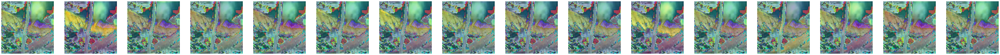

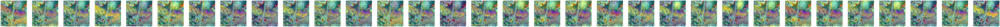

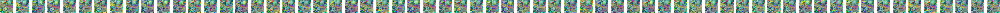

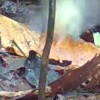

In [426]:
import torch
import os
from PIL import Image
from torchvision import transforms

# Define the device
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# Load the trained model
model_path = os.path.expanduser('~/Desktop/vids/models/0.9438444924406048_thirdmodel.pth')
model3 = BirdNet()
model3.load_state_dict(torch.load(model_path, map_location=device))
model3.to(device)
model3.eval()

# Load and preprocess an example image
image_path = os.path.expanduser("~/Desktop/Manacus_Copulation.2-WYG (1) copy") + '/' + random.choice(os.listdir(os.path.expanduser("~/Desktop/Manacus_Copulation.2-WYG (1) copy")))
image = Image.open(image_path).convert('RGB')
preprocess = transforms.Compose([
    transforms.Resize((100, 100)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.5, 0.5, 0.5], std=[0.5, 0.5, 0.5])
])
input_tensor = preprocess(image).unsqueeze(0).to(device)  # Add batch dimension and move to the correct device

# Function to hook into intermediate layers and get their outputs
def get_interested_layers(layer_name):
    def hook_fn(module, input, output):
        intermediate_outputs[layer_name] = output
    return hook_fn

# Register hooks to extract intermediate outputs
interested_layers = ['conv1', 'conv2', 'conv3']  # Layers to visualize
intermediate_outputs = {}
hooks = []
for layer_name in interested_layers:
    layer = getattr(model3, layer_name)
    hook = layer.register_forward_hook(get_interested_layers(layer_name))
    hooks.append(hook)

# Perform forward pass to get intermediate outputs
with torch.no_grad():
    model_output = model3(input_tensor)

# Unregister the hooks
for hook in hooks:
    hook.remove()

# Visualize the feature maps

# Visualize the feature maps overlaid on the original image
for layer_name, feature_map in intermediate_outputs.items():
    num_features = feature_map.size(1)
    fig, axes = plt.subplots(1, num_features, figsize=(num_features * 6, 6))
    
    # Get the original image as a numpy array
    original_image_np = np.array(transforms.ToPILImage()(input_tensor.squeeze().cpu()))
    
    for i in range(num_features):
        ax = axes[i]
        
        # Overlay the feature map on the original image using transparency
        overlay = feature_map[0, i].cpu().numpy()
        overlay = (overlay - overlay.min()) / (overlay.max() - overlay.min())  # Normalize the overlay
        overlay_colored = plt.cm.viridis(overlay)
        overlay_colored = (overlay_colored[:, :, :3] * 255).astype(np.uint8)
        
        # Resize the overlay to match the original image size
        overlay_resized = np.array(Image.fromarray(overlay_colored).resize(original_image_np.shape[:2][::-1]))
        
        # Combine the original image and overlay
        overlaid_image = cv2.addWeighted(original_image_np, 0.6, overlay_resized, 0.4, 0)
        
        ax.imshow(overlaid_image)
        ax.axis('off')
    
    plt.show()
    plt.close()
image